#Introduction:
- The ideas presented in this notebook come primarily from YOLO papers as well as the material taught by professor Andrew NG in the "Convolutional neural networks" course on Coursera website. 
- The implementation here is inspired by [**experiencor**](https://github.com/experiencor/keras-yolo3)'s GitHub repository and uses many components from it . 
- The pretrained weights can be downloaded from [YOLO website](https://pjreddie.com/darknet/yolo/). They are also provided in the "DarkNet_weights" folder!

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from tensorflow import keras
import numpy as np
import time
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

exec(open("/content/gdrive/My Drive/YOLO/code/YOLO_Model.py").read())
exec(open("/content/gdrive/My Drive/YOLO/code/image_preprocessing.py").read())

#Creating YOLO keras model:
create_YOLO_keras_model(weights_path,model_path) function first defines the architecture of the model in keras, then gets the Darknet weights and changes them to be compatible with the keras model. Then it sets the weights and saves the model in a hdf5 file. Later we will load this model and use it.

weights_path is the path to the Darknet weights file, and model_path is the path to the hdf5 file in which we want to save our YOLO keras model. 

**Note:** you do not need to run the following cell. The keras model is already generated and saved in model.hdf5 file in YOLO_keras_model folder.

In [ ]:
create_YOLO_keras_model("/content/gdrive/My Drive/YOLO/DarkNet_weights/yolov3.weights","/content/gdrive/My Drive/YOLO/YOLO_keras_model/model.hdf5")

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

#Loading the keras model to create a model object:
Regarding the following warning, note that we do not need to compile this model as we are not going to train it. We will use it for prediction only.

In [ ]:
#Loading the model
model = keras.models.load_model("/content/gdrive/My Drive/YOLO/YOLO_keras_model/model.hdf5")

#Preprocessing the image:
The input images can be of any size but we should first preprocess them and change their dimension to (416,416,1) as the model was trained on images of this size.
preprocess_image(image_path) function gets the image of any size and outputs a (1,416,416,3) dimensional tensor. The additional dimension added, is the batch size as the model expects inputs of shape (m,416,416,3).

As the name "image_path" suggests the input of this function is the path to the image of interest.




In [ ]:
image,original_img_w,original_img_h = preprocess_image("/content/gdrive/My Drive/YOLO/images/Trudeau_Trump.jpg")

new image shape is: (1, 416, 416, 3)


#Get the output of the model:
The YOLO model returns 3 outputs each being a (m,grid_size,grid_size,255) where:

- m is the batch size

- grid_size is the size of the grid that is placed on the image for the purpose of object detection(the model uses 13x13, 26x26, 52x52 grid sizes).
- 255 is obtained based on the fact that we have 3 bounding boxes for each grid cell. Each bounding box is represented by a 85 dimensional tensor (tx, ty, tw, th, Po, C1,C2, ...,C80). tx,ty are related to the center coordinate of the bounding box and tw,th are related to the width and height of the bounding box. Po will be used to determine the probability that the bounding box includes an object. C1,...,C80 are used to compute the probability that the bounding box has the object from class Ci.

In [ ]:
yhat = model.predict(image)
print("shape of 3 outputs of the YOLO model:",[a.shape for a in yhat])

shape of 3 outputs of the YOLO model: [(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


#Decoding bounding boxes, Selecting the most probable ones and showing them along with the original image:
We will use several classes and functions. Each of them are explained thoroughly. 

##class BoundBox:
This class will be used to create a bounding box instance with xmin,ymin, xmax, ymax, objectness, and classes attributes.
- xmin and ymin are coordinates of the top left corner of the rectangle while xmax and y max are the coordinates of the bottom right corner of the rectangle(bounding box).

- objectness is a number in range [0,1] which shows how confident the model is about detecting an object.

- classes are the class scores for each and every of the 80 classes. classes is a 80 dimensional vector with values in range [0,1].

In [ ]:
class BoundBox:
	def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
		self.xmin = xmin
		self.ymin = ymin
		self.xmax = xmax
		self.ymax = ymax
		self.objness = objness
		self.classes = classes

##Sigmoid function:

In [ ]:
def _sigmoid(x):
	return 1. / (1. + np.exp(-x))

##decode_netout(netout, anchors, obj_thresh, net_h, net_w):
This function gets the outputs of the model(netout), width and height of the anchor boxes(anchors), and width and height of the input to the network(416x416).

Then: 
- Decodes the coordinates of the bounding boxes and computes the objectnesss score. The formulas used to compute objectness score (Pc) and convert the model's outputs to correct coordinates is given below:

   Pc= sigmoid(Po)

   bx= sigmoid(tx)+cx, by= sigmoid(ty)+cy,  bw=pw.exp(tw), bh=ph.exp(th)

   where cx,cy are the coordinates of the top left corner of the grid cell. bx and by are the coordinates of the center of the bounding box, bw and bh are the width and height of the bounding box.

- computes classes scores as we expect them to look like(a probability between 0 and 1):
    
    class score for Ci= Pc*sigmoid(Ci)
- Keeps only the bounding boxes with an objectness score larger than a certain threshold(I used 0.5 for this threshold)
- sets class scores smaller than this threshold(Pc*sigmoid(Ci)<0.5) to 0

**As a result, at the end we will have the bounding boxes which have at least 50% (0.5) objectness scores and within these boxes the class score values are either 0 or larger than 0.5**

In [ ]:
def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
	grid_h, grid_w = netout.shape[:2]                                                  
	nb_box = 3
	netout = netout.reshape((grid_h, grid_w, nb_box, -1))                              
	nb_class = netout.shape[-1] - 5
	boxes = []   
                                                            
	netout[:,:,:, :2]  = _sigmoid(netout[:,:,:, :2])                                    
	netout[:,:,:, 4:]  = _sigmoid(netout[:,:,:, 4:])                                   
	netout[:,:,:, 5:]  = np.expand_dims(netout[:,:,:, 4],axis=-1) * netout[:,:,:, 5:]  
	netout[:,:,:, 5:] *= netout[:,:,:, 5:] > obj_thresh                                
	                                                                                   
	

	for i in range(grid_h*grid_w):                                                     
		row = i / grid_w                                                                 
		col = i % grid_w
		for b in range(nb_box):                                                          
			objectness = netout[int(row)][int(col)][b][4]                      # 4th element is objectness score                                  
			if(objectness >= obj_thresh): 
			    #85 dimensional vector:(sigmoid(tx),sigmoid(ty),tw,th,sigmoid(pc), sigmoid(pc)*sigmoid(c1),..., sigmoid(pc)*sigmoid(c80))
				x_cell , y_cell, tw, th = netout[int(row)][int(col)][b][:4]                             
				x = (col + x_cell) / grid_w                                                   
				y = (row + y_cell) / grid_h 
				w = anchors[2 * b + 0] * np.exp(tw) / net_w 
				h = anchors[2 * b + 1] * np.exp(th) / net_h 
				classes = netout[int(row)][col][b][5:]
				#bounding box coordinates with respects to unit image width or unit image height. 
				box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
				boxes.append(box)
	return boxes

##correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
This function gets the outputs of the decode_netout function and resizes them so that they are compatible with the original image's size.The outputs of the decode_netout are computed based on the unit image size so by multiplying them by the original size of the image we can get the desired result.


In [ ]:
def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):                  
	for i in range(len(boxes)):                                                  
		boxes[i].xmin = int(boxes[i].xmin * image_w)
		boxes[i].xmax = int(boxes[i].xmax * image_w)
		boxes[i].ymin = int(boxes[i].ymin * image_h)
		boxes[i].ymax = int(boxes[i].ymax * image_h)

##non_max_suppression(boxes, nms_thresh):
The boxes that we get from previous steps are still not appropriate for being displayed on the image. There is a high chance that we have multiple boxes with Pc> 0.5 detecting exactly the same object in the image. That is what non_max_suppression function helps us with. It finds the box that has the highest score for a specific object class and then finds all of the boxes with an intersection over union(IOU) of 0.5 or higher with this box, and sets their class score for that specific object to zero.


Based on the fact that in this architecture "Sigmoid" function is used instead of "Softmax", it is probable that we have a box with two or more class scores higher than 0.5. Setting that specific class score to 0 in the previous step makes sure that the box can be used for prediction of other objects(if any). This is very helpful for the times when we have two objects, from different classes, close to each other(with IOU of higher than 0.5) removing the boxes only based on IOU will result in not detecting one of them. For example, if we have a car and a truck (one of them somewhat covering the other one), we will still be able to detect both of them and at them same time we can be sure that those two boxes are detecting different object not the same object(car or truck).

_interval_overlap(interval_a, interval_b) function is used in the computation of the IOU of the boxes in bbox_iou(box1, box2) function and bbox_iou(box1, box2) itself is used in the non_max_suppression(boxes, nms_thresh) function.
 

In [ ]:
def _interval_overlap(interval_a, interval_b):
	x1, x2 = interval_a
	x3, x4 = interval_b
	if x3 < x1:
		if x4 < x1:
			return 0
		else:
			return min(x2,x4) - x1
	else:
		if x2 < x3:
			 return 0
		else:
			return min(x2,x4) - x3

########################################################################################################
def bbox_iou(box1, box2):
	intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
	intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
	intersect = intersect_w * intersect_h
	w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
	w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
	union = w1*h1 + w2*h2 - intersect
	return float(intersect) / union

#########################################################################################################
def non_max_suppression(boxes, nms_thresh):                                   
	if len(boxes) > 0:                                                            
		nb_class = len(boxes[0].classes)                                            
	else:
		return
	for c in range(nb_class):                                                     
		sorted_indices = np.argsort([-box.classes[c] for box in boxes])              
		for i in range(len(sorted_indices)):                                        
			index_i = sorted_indices[i]                                               
			if boxes[index_i].classes[c] != 0:                                        
				for j in range(i+1, len(sorted_indices)):                               
					index_j = sorted_indices[j]
					if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:            
						boxes[index_j].classes[c] = 0 

##get_boxes(boxes, thresh,one_obj_more_obj_thresh):
In this function we will finalize the boxes that we are going to show on the images. The inputs of the function are the boxes acquired from the non_max_suppression function and two threshold.

For each box we will iterate over all of the class scores and check whether the score is higher than a threshold(thresh) or not. Different scenarios could happen at this stage:
- There is no class for a specific box that has a score larger than thresh -> this box will not be added to the final list of boxes(v_boxes).
- There is only one class that has a score larger than the threshold -> this box along with its label and and score will be added to the final list of boxes.
- There are more than on class having scores larger than the threshold -> we select the one with the largest score and introduce the coresponding label as the label for that box.

Finally there could be a case were two boxes which are highly overlapped predict two different labels for one object. For example, the Orange car in the "/images/car.jpg" will have two, boxes one predicting "car" and one predicting "truck". The last step iterates over all of the boxes in the v_boxes and find those having large IOU (let's say 0.8) and keeps the one which has the highest score.

In [ ]:
def get_boxes(boxes, thresh,one_obj_more_obj_thresh):
	labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
            "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
            "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
            "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
            "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
            "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
            "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
            "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
            "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
            "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]
	v_boxes, v_labels, v_scores = [], [], []
	score_max=0
	# enumerate all boxes
	for box in boxes:                                                 
		# enumerate all possible labels
		for i in range(len(labels)):
			# check if the threshold for this label is high enough
			if box.classes[i] > thresh:                                               
				if box.classes[i]*100 > score_max:                                     
					label_max=labels[i]
					score_max= box.classes[i]*100
			if (i==len(labels)-1) and (score_max!=0):          
				v_boxes.append(box)                                                     													
				v_labels.append(label_max)                                            
				v_scores.append(score_max)
				score_max=0

	to_be_removed=[]                                                              #last step                                                 
	for i in range(len(v_boxes)):
		if i==(len(v_boxes)-1): 
				break
		for j in range(i+1,len(v_boxes)):
			if bbox_iou(v_boxes[i], v_boxes[j]) >= one_obj_more_obj_thresh:           
				if v_scores[i] > v_scores[j]:
					to_be_removed.append(j)                                               
				else:
					to_be_removed.append(i)                                               
	v_boxes= [v_boxes[i] for index, i in enumerate(range(len(v_boxes))) if i not in set(to_be_removed)]
	v_labels= [v_labels[i] for index, i in enumerate(range(len(v_labels))) if i not in set(to_be_removed)]
	v_scores= [v_scores[i] for index, i in enumerate(range(len(v_scores))) if i not in set(to_be_removed)]	
	return v_boxes, v_labels, v_scores


##draw_boxes(image_path, v_boxes, v_labels, v_scores):
This function will get the list of boxes and their attributes and displays them on the original image.

In [ ]:
def draw_boxes(image_path, v_boxes, v_labels, v_scores):
  img = plt.imread(image_path)                          
  fig, ax = plt.subplots(figsize=(15,15))
  ax.imshow(img)
  ax.axis('off')
	# plot each box
  for i in range(len(v_boxes)):
    box = v_boxes[i]
		# get coordinates
    y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
		# calculate width and height of the box
    width, height = x2 - x1, y2 - y1
		# create the shape
    rect = Rectangle((x1, y1), width, height, fill=False, color='blue')         #creat a rectangle object
    ax.add_patch(rect)                                                          #add the rectangle to the image
    ax.text(x1, y1, "{} {}".format(v_labels[i], v_scores[i]), color='white')      #adds text to a specific point on the image
  # show the plot
  plt.show()

#Put everything together:
**At this step I have put everything together.**

**We will enumerate over a list of images of different size and use YOLO for object detection** 

In [ ]:
network_input_w, network_input_h = 416, 416
# define the anchor boxes
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]] 
# define the probability threshold for detected objects
class_threshold = 0.5

new image shape is: (1, 416, 416, 3)
car 99.68342781066895
car 98.60942363739014
car 99.93881583213806
car 99.77014660835266
car 99.51008558273315
car 98.07202816009521
car 89.86653089523315
car 98.9316999912262
car 99.403315782547
car 99.60033893585205


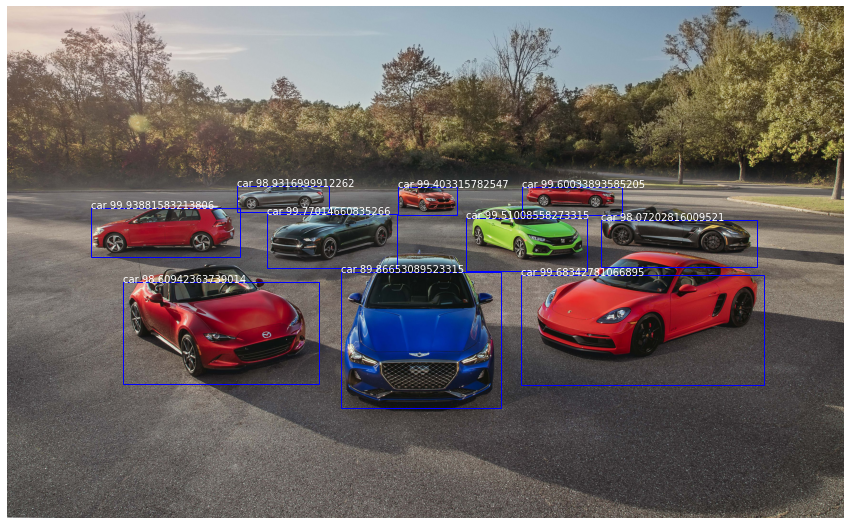

new image shape is: (1, 416, 416, 3)
person 71.43380045890808
person 99.37573075294495


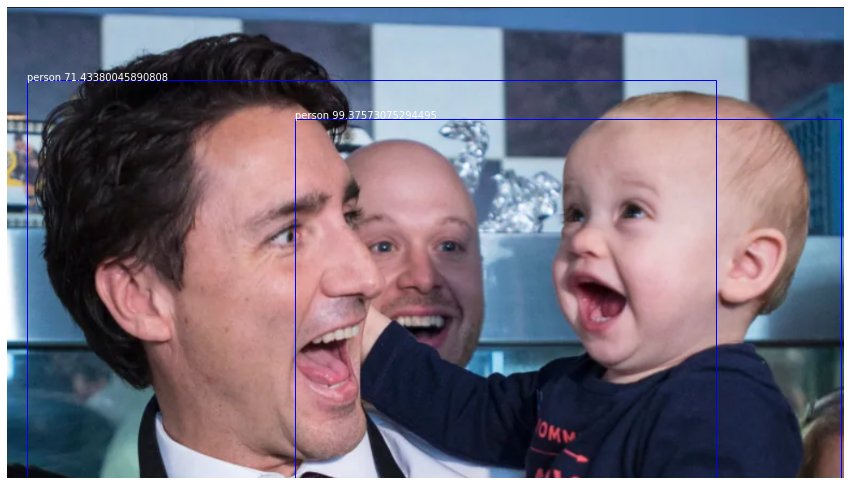

new image shape is: (1, 416, 416, 3)
person 99.90067481994629
person 99.5498776435852
tie 87.9485547542572
tie 75.43236017227173


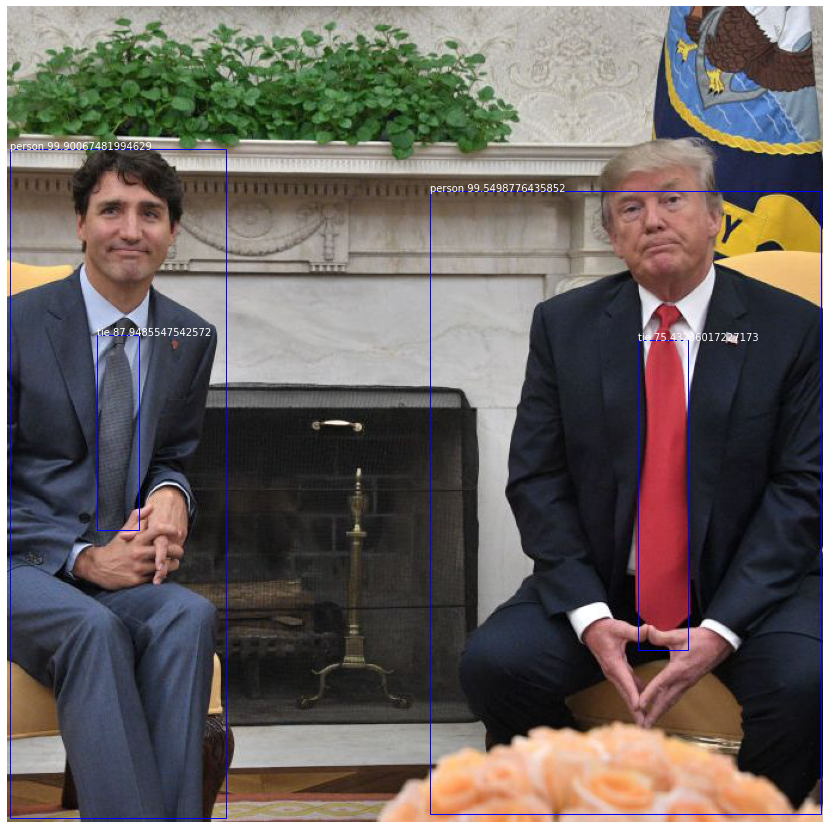

new image shape is: (1, 416, 416, 3)
car 68.00544261932373


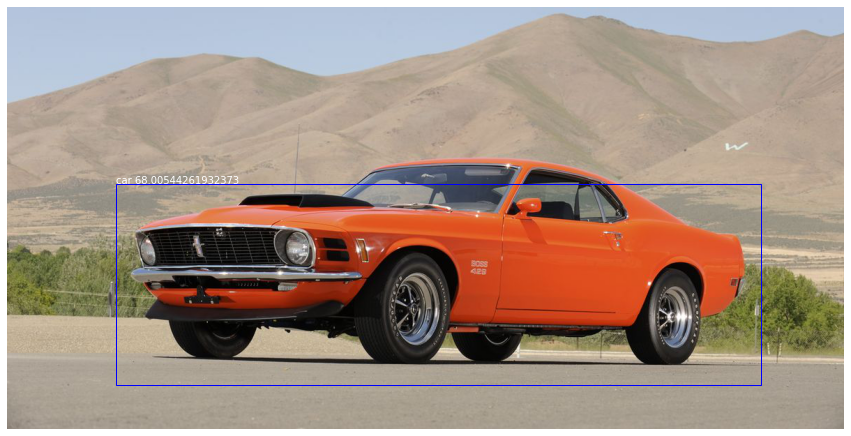

new image shape is: (1, 416, 416, 3)
car 91.30502343177795
car 99.631267786026
car 83.61606001853943
car 95.810067653656
car 57.73345232009888
car 97.52987027168274
car 98.82895946502686
car 98.44787120819092
traffic light 79.17688488960266
traffic light 69.98324990272522
traffic light 79.74587678909302
traffic light 71.30019068717957
traffic light 78.4149706363678
traffic light 58.27550292015076


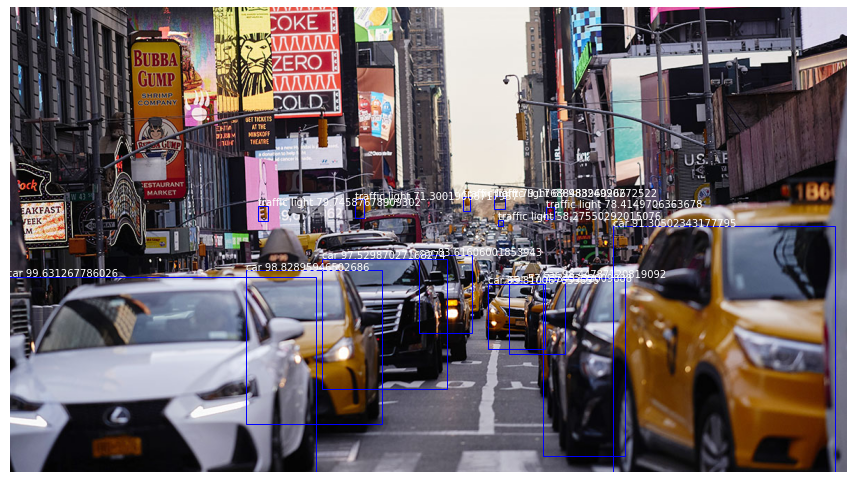

new image shape is: (1, 416, 416, 3)
person 52.21015810966492
person 76.80770754814148
person 67.68214702606201
person 99.19083714485168
person 82.26379752159119
person 58.20062756538391
person 97.52318859100342
person 96.75684571266174
person 99.43501949310303
person 99.91020560264587
bicycle 62.3555064201355
person 98.56832027435303
bicycle 92.00692176818848
person 63.040947914123535
person 51.92296504974365
person 85.17445921897888
person 94.038325548172
person 66.62242412567139
person 58.457183837890625
person 66.0260558128357
person 81.23776912689209
person 83.67993831634521
person 91.68016314506531
bicycle 72.25986123085022
bicycle 73.80095720291138


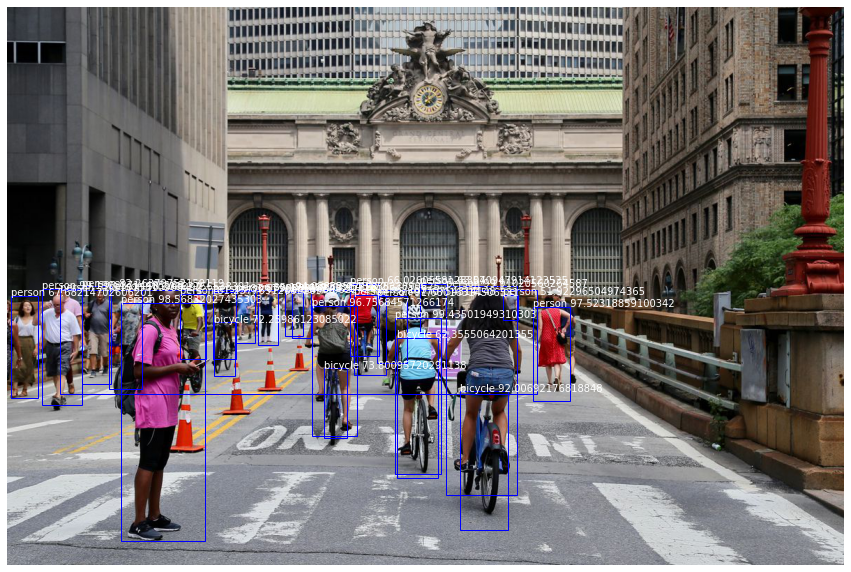

new image shape is: (1, 416, 416, 3)
aeroplane 99.90706443786621
aeroplane 99.90483522415161
aeroplane 99.78838562965393
aeroplane 99.84063506126404
aeroplane 99.7218906879425
aeroplane 99.79621767997742
aeroplane 99.84688758850098
aeroplane 99.7241199016571
aeroplane 99.89789724349976


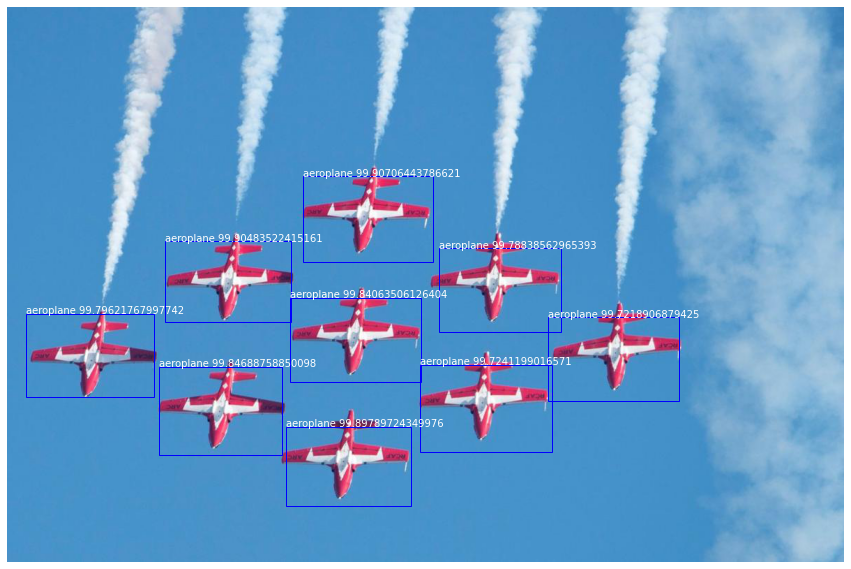

new image shape is: (1, 416, 416, 3)
truck 57.16494917869568
car 85.924631357193
car 95.71096897125244
car 82.01172947883606
truck 84.82975959777832
car 92.95655488967896
person 97.54208326339722
person 54.638803005218506
person 91.47095084190369
car 92.72603392601013
car 98.59970808029175
car 94.33823227882385
car 81.11324906349182
car 60.2871298789978
person 54.24466133117676


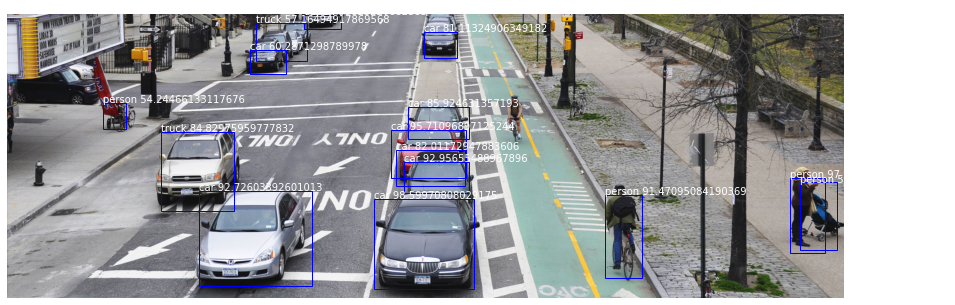

new image shape is: (1, 416, 416, 3)
truck 99.6845006942749


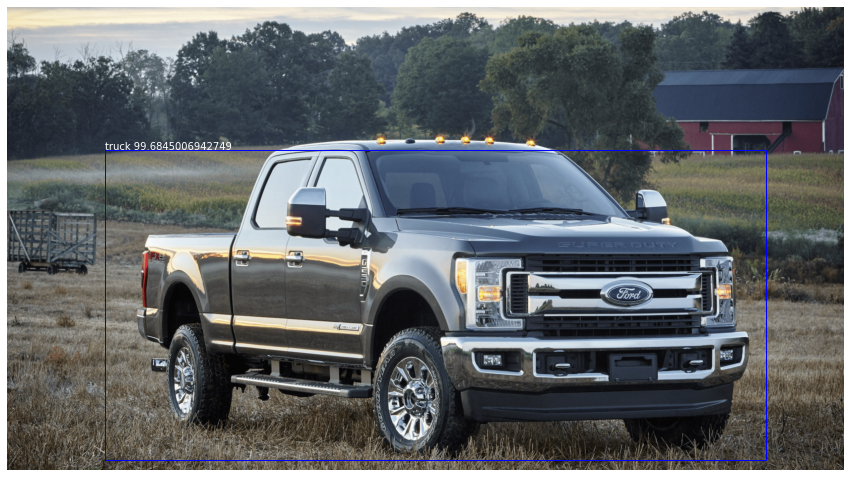

new image shape is: (1, 416, 416, 3)
zebra 99.45483207702637
zebra 98.56860041618347


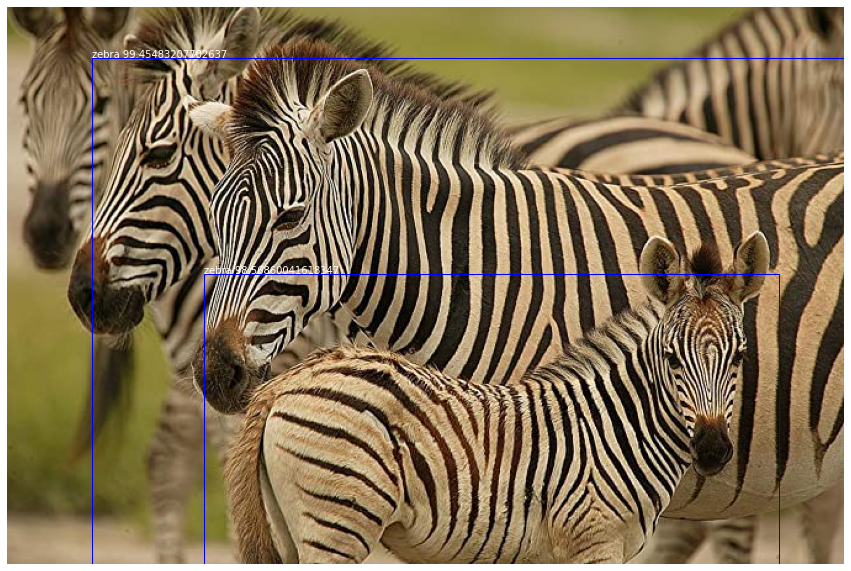

new image shape is: (1, 416, 416, 3)
pottedplant 97.20346927642822
pottedplant 55.85283637046814
pottedplant 99.13486242294312
pottedplant 94.44841742515564
chair 99.67926740646362
chair 99.90893006324768
laptop 52.00986862182617


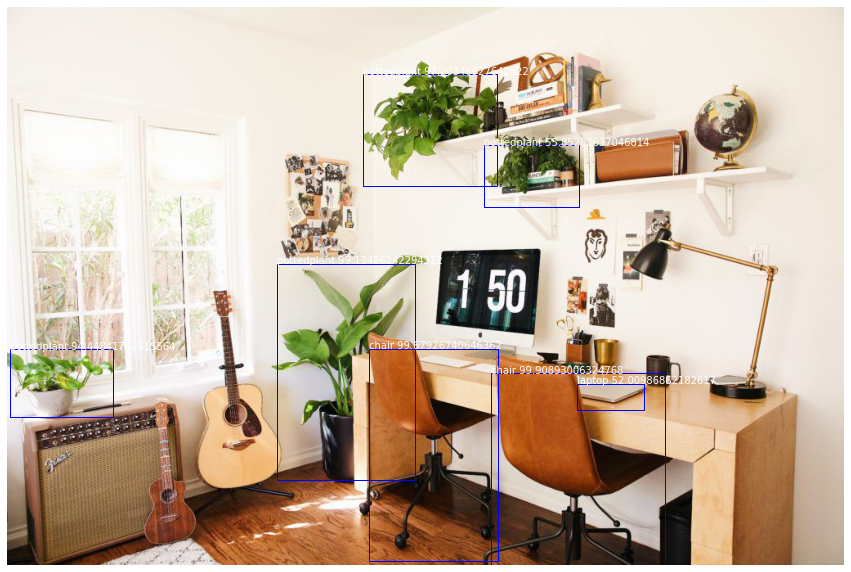

new image shape is: (1, 416, 416, 3)
pottedplant 97.22917675971985
sofa 98.4827995300293
chair 87.81534433364868
pottedplant 96.61234617233276
vase 73.10124039649963


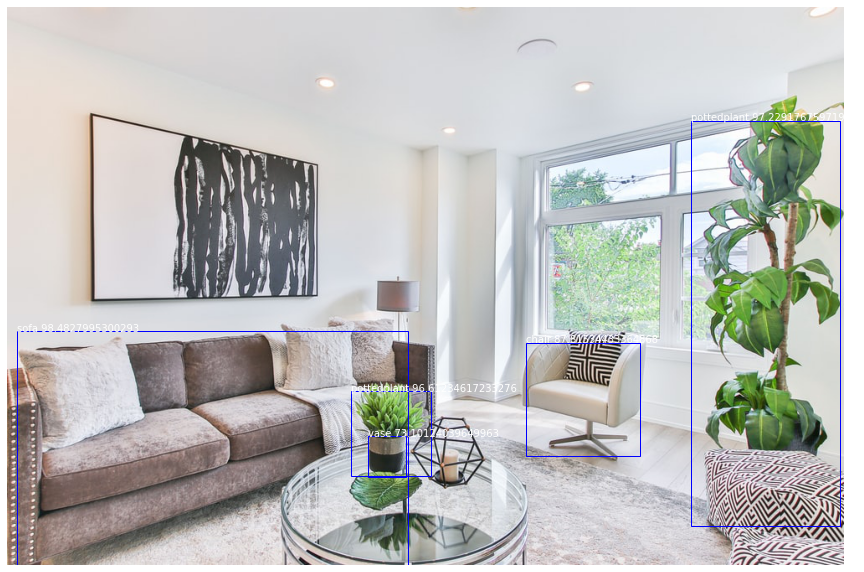

In [ ]:
list_of_images=["/content/gdrive/My Drive/YOLO/images/10best-cars-group-cropped-1542126037.jpg",
                "/content/gdrive/My Drive/YOLO/images/Trudeau.PNG",
                "/content/gdrive/My Drive/YOLO/images/Trudeau_Trump.jpg",
                "/content/gdrive/My Drive/YOLO/images/car.jpg",
                "/content/gdrive/My Drive/YOLO/images/newyork.jpg",
                "/content/gdrive/My Drive/YOLO/images/people.jpg",
                "/content/gdrive/My Drive/YOLO/images/royal_Canadian_Air_Force_acrobats.jpg",
                "/content/gdrive/My Drive/YOLO/images/street.jpg",
                "/content/gdrive/My Drive/YOLO/images/truck.png",
                "/content/gdrive/My Drive/YOLO/images/zebra.jpg",
                "/content/gdrive/My Drive/YOLO/images/Home-Office.jpg",
                "/content/gdrive/My Drive/YOLO/images/modern_living_room.jpg"                
                ]
for i in range(len(list_of_images)):
  image,original_img_w,original_img_h = preprocess_image(list_of_images[i])
  yhat = model.predict(image)
  boxes=[]
  for j in range(len(yhat)):
	  boxes += decode_netout(yhat[j][0], anchors[j], class_threshold, network_input_h, network_input_w)
  correct_yolo_boxes(boxes, original_img_h, original_img_w, network_input_h, network_input_w)
  non_max_suppression(boxes, 0.5)
  v_boxes, v_labels, v_scores = get_boxes(boxes, class_threshold, 0.8)
  for k in range(len(v_boxes)):
	  print(v_labels[k], v_scores[k])
  draw_boxes(list_of_images[i], v_boxes, v_labels, v_scores)